In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/re/other/default/1/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5
/kaggle/input/garbage-classification/garbage_classification/metal/metal375.jpg
/kaggle/input/garbage-classification/garbage_classification/metal/metal561.jpg
/kaggle/input/garbage-classification/garbage_classification/metal/metal341.jpg
/kaggle/input/garbage-classification/garbage_classification/metal/metal688.jpg
/kaggle/input/garbage-classification/garbage_classification/metal/metal374.jpg
/kaggle/input/garbage-classification/garbage_classification/metal/metal427.jpg
/kaggle/input/garbage-classification/garbage_classification/metal/metal383.jpg
/kaggle/input/garbage-classification/garbage_classification/metal/metal692.jpg
/kaggle/input/garbage-classification/garbage_classification/metal/metal560.jpg
/kaggle/input/garbage-classification/garbage_classification/metal/metal702.jpg
/kaggle/input/garbage-classification/garbage_classification/metal/metal215.jpg
/kaggle/input/garbage-classification/garbage_

In [2]:
os.listdir("/kaggle/input/garbage-classification/garbage_classification/")

['metal',
 'white-glass',
 'biological',
 'paper',
 'brown-glass',
 'battery',
 'trash',
 'cardboard',
 'shoes',
 'clothes',
 'plastic',
 'green-glass']

In [3]:
for class_ in os.listdir("/kaggle/input/garbage-classification/garbage_classification/"):
    count_class = 0
    for photo in os.listdir("/kaggle/input/garbage-classification/garbage_classification/" + class_):
        count_class += 1
    print(str(class_) + " has " + str(count_class) + " photos")  

metal has 769 photos
white-glass has 775 photos
biological has 985 photos
paper has 1050 photos
brown-glass has 607 photos
battery has 945 photos
trash has 697 photos
cardboard has 891 photos
shoes has 1977 photos
clothes has 5325 photos
plastic has 865 photos
green-glass has 629 photos


In [4]:
%%time

data = pd.DataFrame()
for class_ in os.listdir("/kaggle/input/garbage-classification/garbage_classification/"):
    temp = pd.DataFrame()
    temp['path'] = np.nan
    temp['target'] = class_
    i = 0
    for photo in os.listdir("/kaggle/input/garbage-classification/garbage_classification/" + class_):
        temp.loc[i, 'path'] = "/kaggle/input/garbage-classification/garbage_classification/" + class_ + "/" + photo
        temp.loc[i, 'target'] = class_
        i += 1
    data = pd.concat([data, temp], ignore_index=True)
    del temp

CPU times: user 12.6 s, sys: 53.3 ms, total: 12.6 s
Wall time: 12.6 s


In [5]:
data.shape

(15515, 2)

In [6]:
data.duplicated().sum()

0

In [7]:
data = data.sample(frac=1)
data.reset_index(drop=True, inplace=True)
data.head()

,path,target
0,/kaggle/input/garbage-classification/garbage_c...,brown-glass
1,/kaggle/input/garbage-classification/garbage_c...,clothes
2,/kaggle/input/garbage-classification/garbage_c...,clothes
3,/kaggle/input/garbage-classification/garbage_c...,paper
4,/kaggle/input/garbage-classification/garbage_c...,plastic


/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'brown-glass'),
  Text(1, 0, 'clothes'),
  Text(2, 0, 'paper'),
  Text(3, 0, 'plastic'),
  Text(4, 0, 'battery'),
  Text(5, 0, 'shoes'),
  Text(6, 0, 'biological'),
  Text(7, 0, 'metal'),
  Text(8, 0, 'cardboard'),
  Text(9, 0, 'green-glass'),
  Text(10, 0, 'white-glass'),
  Text(11, 0, 'trash')])

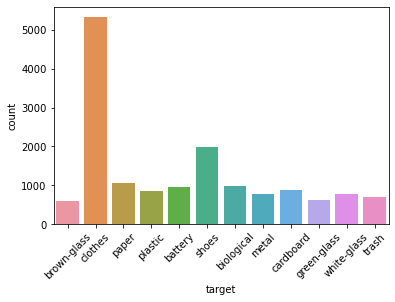

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.countplot(data['target'])
plt.xticks(rotation="45")

In [9]:
data['target'].value_counts()

clothes        5325
shoes          1977
paper          1050
biological      985
battery         945
cardboard       891
plastic         865
white-glass     775
metal           769
trash           697
green-glass     629
brown-glass     607
Name: target, dtype: int64

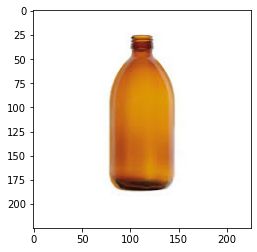

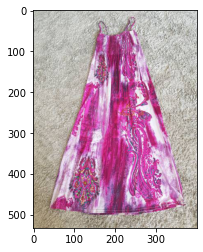

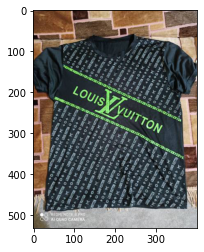

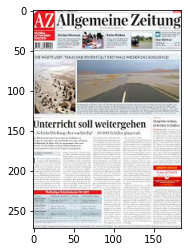

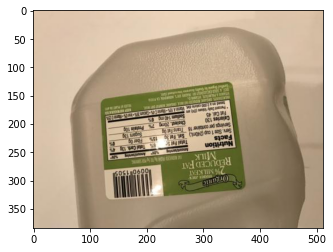

...

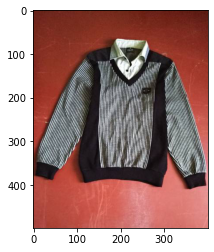

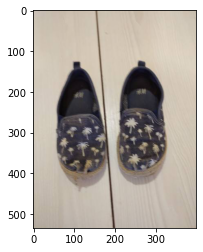

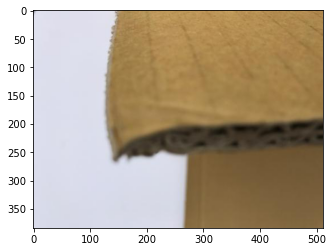

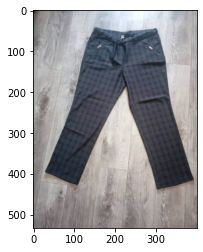

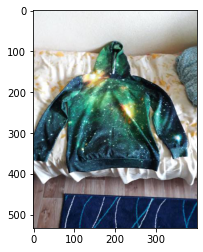

In [10]:
import matplotlib.image as mpimg

for i in range(100):
    image = mpimg.imread(data.loc[i, 'path'])
    plt.imshow(image)
    plt.show()

In [11]:
total_counts = 0

for class_ in os.listdir("/kaggle/input/garbage-classification/garbage_classification/"):
    count_class = 0
    for photo in os.listdir("/kaggle/input/garbage-classification/garbage_classification/" + class_):
        count_class += 1
        total_counts += 1
    print(str(class_) + " has " + str(count_class) + " photos")

metal has 769 photos
white-glass has 775 photos
biological has 985 photos
paper has 1050 photos
brown-glass has 607 photos
battery has 945 photos
trash has 697 photos
cardboard has 891 photos
shoes has 1977 photos
clothes has 5325 photos
plastic has 865 photos
green-glass has 629 photos


In [12]:
total_counts

15515

In [13]:
weights_ = dict()
for class_ in os.listdir("/kaggle/input/garbage-classification/garbage_classification/"):
    count_class = 0
    for photo in os.listdir("/kaggle/input/garbage-classification/garbage_classification/" + class_):
        count_class += 1
    print(str(class_) + " has " + str((count_class/total_counts) * 100) + "% of photos")
    weights_[class_] = 1 - (count_class/total_counts)

metal has 4.956493715758943% of photos
white-glass has 4.995165968417661% of photos
biological has 6.348694811472769% of photos
paper has 6.767644215275539% of photos
brown-glass has 3.912342893973574% of photos
battery has 6.090879793747986% of photos
trash has 4.492426683854334% of photos
cardboard has 5.74282951981953% of photos
shoes has 12.742507251047375% of photos
clothes has 34.32162423461166% of photos
plastic has 5.575249758298421% of photos
green-glass has 4.054141153722204% of photos


In [14]:
weights_

{'metal': 0.9504350628424105,
 'white-glass': 0.9500483403158234,
 'biological': 0.9365130518852723,
 'paper': 0.9323235578472446,
 'brown-glass': 0.9608765710602643,
 'battery': 0.9390912020625202,
 'trash': 0.9550757331614567,
 'cardboard': 0.9425717048018047,
 'shoes': 0.8725749274895263,
 'clothes': 0.6567837576538833,
 'plastic': 0.9442475024170158,
 'green-glass': 0.959458588462778}

In [15]:
from sklearn import model_selection

X_train, X_test = model_selection.train_test_split(data, test_size=0.2, random_state=0, stratify=data['target'])

In [16]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from tensorflow.keras.models import Sequential

In [17]:
IMAGE_SIZE = [224, 224]

In [19]:
resnet50 = ResNet50(input_shape=IMAGE_SIZE + [3], weights='/kaggle/input/re/other/default/1/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5', include_top=False)

In [20]:
for layer in resnet50.layers:
    layer.trainable = False

In [21]:
classes = len(os.listdir("/kaggle/input/garbage-classification/garbage_classification/"))
classes

12

In [22]:
x = Flatten()(resnet50.output)

In [23]:
prediction = Dense(classes, activation='softmax')(x)

# create a model object
model = Model(inputs=resnet50.input, outputs=prediction)

In [24]:
from tensorflow.keras.metrics import categorical_accuracy

In [25]:
model.compile(optimizer='Adam',
            loss='categorical_crossentropy',
            metrics=[categorical_accuracy])

In [26]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
______________________________________________________________________________________________

In [27]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   rotation_range=40,
                                   width_shift_range=0.25,
                                   height_shift_range=0.25,
                                   shear_range = 0.2,
                                   zoom_range = 0.3,
                                   fill_mode='nearest',
                                   horizontal_flip = True)

In [28]:
test_datagen = ImageDataGenerator(rescale = 1./255)

In [29]:
training_set = train_datagen.flow_from_dataframe(X_train,
                                                 x_col="path",
                                                 y_col="target",
                                                 target_size = (224, 224),
                                                 batch_size = 32,
                                                 color_mode="rgb",
                                                 class_mode = 'categorical')

Found 12412 validated image filenames belonging to 12 classes.


In [30]:
testing_set = test_datagen.flow_from_dataframe(X_test,
                                               x_col="path",
                                               y_col="target",
                                               target_size = (224, 224),
                                               batch_size = 32,
                                               color_mode="rgb",
                                               class_mode = 'categorical')

Found 3103 validated image filenames belonging to 12 classes.


In [31]:
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau

early = EarlyStopping(monitor="val_loss", 
                      mode="min", 
                      patience=3)

learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss', patience = 2, verbose=1,factor=0.3, min_lr=0.00001)

callbacks_list = [early, learning_rate_reduction]

In [32]:
from sklearn.utils.class_weight import compute_class_weight
weights = compute_class_weight('balanced', np.unique(X_train.target), X_train.target)
cw = dict(zip(np.unique(X_train.target), weights))

/opt/conda/lib/python3.7/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass classes=['battery' 'biological' 'brown-glass' 'cardboard' 'clothes' 'green-glass'
 'metal' 'paper' 'plastic' 'shoes' 'trash' 'white-glass'], y=10154    cardboard
5021         shoes
12513      battery
13754        shoes
10120      clothes
           ...    
2449         shoes
5026       clothes
1051         metal
10390      battery
11203      clothes
Name: target, Length: 12412, dtype: object as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


In [33]:
cw

{'battery': 1.3681657848324515,
 'biological': 1.3126057529610828,
 'brown-glass': 2.128257887517147,
 'cardboard': 1.4506778868630201,
 'clothes': 0.24280125195618155,
 'green-glass': 2.0563286944996686,
 'metal': 1.6818428184281842,
 'paper': 1.2313492063492064,
 'plastic': 1.4947013487475915,
 'shoes': 0.6542272823107738,
 'trash': 1.8536439665471924,
 'white-glass': 1.668279569892473}

In [34]:
weights_

{'metal': 0.9504350628424105,
 'white-glass': 0.9500483403158234,
 'biological': 0.9365130518852723,
 'paper': 0.9323235578472446,
 'brown-glass': 0.9608765710602643,
 'battery': 0.9390912020625202,
 'trash': 0.9550757331614567,
 'cardboard': 0.9425717048018047,
 'shoes': 0.8725749274895263,
 'clothes': 0.6567837576538833,
 'plastic': 0.9442475024170158,
 'green-glass': 0.959458588462778}

In [ ]:
history = model.fit_generator(
  training_set,
  validation_data=testing_set,
  epochs=17,
  steps_per_epoch=len(training_set),
  validation_steps=len(testing_set),
  callbacks=callbacks_list
)

/opt/conda/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/17
388/388 [==============================] - 1540s 4s/step - loss: 4.6844 - categorical_accuracy: 0.2732 - val_loss: 2.7358 - val_categorical_accuracy: 0.4418
Epoch 2/17
334/388 [========================>.....] - ETA: 2:51 - loss: 2.6335 - categorical_accuracy: 0.3775

In [ ]:
choice = input("do you want to proceed.....(type yes if you wanna proceed else no):")
if choice == "yes":
    history = model.fit_generator(
      training_set,
      validation_data=testing_set,
      epochs=15,
      steps_per_epoch=len(training_set),
      validation_steps=len(testing_set),
      callbacks=callbacks_list
    )

In [ ]:
choice = input("do you want to proceed.....(type yes if you wanna proceed else no):")
if choice == "yes":
    history = model.fit_generator(
      training_set,
      validation_data=testing_set,
      epochs=15,
      steps_per_epoch=len(training_set),
      validation_steps=len(testing_set),
      callbacks=callbacks_list
    )

In [ ]:
filenames = testing_set.filenames
nb_samples = len(filenames)

model.evaluate_generator(testing_set, nb_samples)

In [ ]:
from tensorflow.keras import models

In [ ]:
models.save_model(model, "model.h5")